In [ ]:
# using same venv as for proj1 so I don't think we need to reinstall :D
!pip install numpy scikit-image
!pip install matplotlib
!pip install imageio
!pip install opencv-python
%pip install --force-reinstall numpy==2.2.6 opencv-python

In [6]:
import numpy as np
import skimage as sk
import skimage.io as skio

import matplotlib.pyplot as plt        # For displaying images and plots
import imageio.v3 as iio               # For loading/saving images (preferred)
import cv2                             # OpenCV for computer vision operations
from skimage import io, color


Part 1: Fun with Filters

Part 1.1: Convolutions from Scratch!

First, let's recap what a convolution is. Implement it with four for loops, then two for loops. Implement padding, with zero fill values; convolution without padding will receive partial credit. Compare it with a built-in convolution function scipy.signal.convolve2d! Then, take a picture of yourself (and read it as grayscale), write out a 9x9 box filter, and convolve the picture with the box filter. Do it with the finite difference operators Dx and Dy as well. Include the code snippets in the website!

What can you use for this section? This section is meant to be done with numpy only, simple array operations.

In [2]:
# remember to flip the filter/kernel! + add padding 0s on every side of the image
# four for loops

def convolution4(image, filter):
    # add padding 0s on every side of the image by appending arrays
    # 4 for loops

    img_height, img_width = image.shape
    filter_height, filter_width = filter.shape

    pad_height = filter_height // 2
    pad_width = filter_width // 2

    padded_image = np.zeros((img_height + 2 * pad_height, img_width + 2 * pad_width))
    padded_image[pad_height:pad_height + img_height, pad_width:pad_width + img_width] = image

    out = np.zeros_like(image)

    # naive imp goes thru every pixel in out, elem wise sum & *multiply
    for y in range(img_height):
        for x in range(img_width):
            current_sum = 0
            for ky in range(filter_height):
                for kx in range(filter_width):
                    # map to ppadded image
                    img_y = y + ky
                    img_x = x + kx
                    current_sum += padded_image[img_y, img_x] * filter[ky, kx]
            out[y, x] = current_sum
            
    return out

In [3]:
def convolution2(image, filter):
    out = np.zeros_like(image)
    img_height, img_width = image.shape
    filter_h, filter_w = filter.shape
    image_padded = np.zeros((image.shape[0] + 2, image.shape[1] + 2))
    image_padded[1:-1, 1:-1] = image

    pad_h = filter_h // 2
    pad_w = filter_w // 2

    image_padded = np.zeros((img_height + 2 * pad_h, img_width + 2 * pad_w))
    image_padded[pad_h:-pad_h, pad_w:-pad_w] = image

    out = np.zeros_like(image)
    
    # flip fiter/kenrel
    flipped_filter = np.flipud(np.fliplr(filter))

    for y in range(img_height):
        for x in range(img_width):
            patch = image_padded[y : y + filter_h, x : x + filter_w]
            out[y, x] = (flipped_filter * patch).sum()
            
    return out

Comparsion with built in convolve

In [4]:
import numpy as np
from scipy.signal import convolve2d
from skimage import data
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# scipy.signal.convolve2d
# convolve2d(in1, in2, mode='full', boundary='fill', fillvalue=0)

try:
    face = data.face(gray=True)
except AttributeError: # For older scikit-image versions
    from scipy.misc import face
    face = rgb2gray(face())


# Define a simple kernel (e.g., a simple blur)
kernel = np.ones((9, 9)) / 81.0

scipy_output = convolve2d(face, kernel, mode='same', boundary='fill', fillvalue=0)

# --- Comparison (Conceptual) ---
manual_output = convolution2(face, kernel)
# The results of `scipy_output` and `manual_output` would be virtually identical,
# but the execution time for the scipy version is drastically shorter.

print("Convolution performed using scipy.signal.convolve2d.")
# To visualize:
plt.imshow(scipy_output, cmap='gray')
plt.title('Scipy convolve2d Result')
plt.show()

C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\399053625.py:13: DeprecationWarning: scipy.misc is deprecated and will be removed in 2.0.0
  from scipy.misc import face


ImportError: cannot import name 'face' from 'scipy.misc' (c:\Users\Hilla\Downloads\cs180\.venv\Lib\site-packages\scipy\misc\__init__.py)

Image loaded and converted to grayscale.


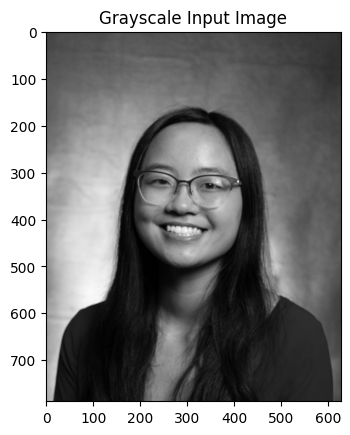

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# --- Load and prepare the image ---
my_image = io.imread('hillary_head.jpg')
# Convert to grayscale
gray_image = color.rgb2gray(my_image)

# Normalize image to be in range [0, 1] if it's not already
if gray_image.max() > 1.0:
    gray_image = gray_image / 255.0

print("Image loaded and converted to grayscale.")
# To visualize:
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Input Image')
plt.show()


C:\Users\Hilla\AppData\Local\Temp\ipykernel_5416\3870776462.py:14: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(blurred_image)
C:\Users\Hilla\AppData\Local\Temp\ipykernel_5416\3870776462.py:15: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


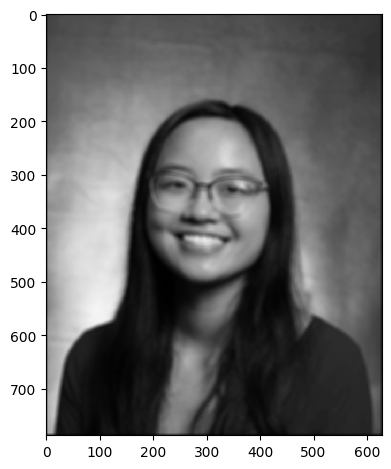

In [ ]:
# 9x9 Box Filter: smooths images by averaging pixel values to reduce noise and details
box_filter_size = 9
box_filter = np.ones((box_filter_size, box_filter_size)) / (box_filter_size ** 2)

blurred_image = convolve2d(gray_image, box_filter, mode='same', boundary='fill', fillvalue=0)

im_out_uint8 = (np.clip(blurred_image, 0, 1) * 255).astype(np.uint8)

fname = 'hillary_blurred.jpg'
# skio.imsave(fname, im_out)
skio.imsave(fname, im_out_uint8)

# display the image
skio.imshow(blurred_image)
skio.show()

# plt.imshow(blurred_image, cmap='gray')
# plt.title('Image with 9x9 Box Filter (Blur)')
# plt.show()

Created Dx and Dy filters and convolved with image to find edges.


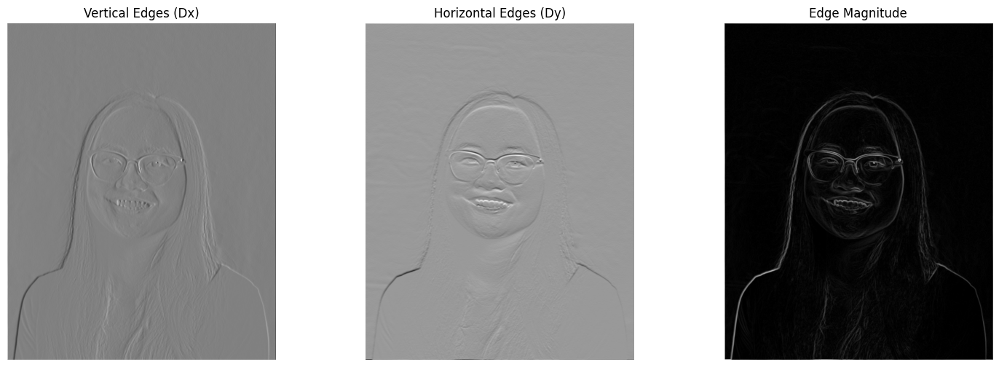

In [ ]:
# finite difference operators
Dx = np.array([[-1, 0, 1]])
Dy = np.array([[-1], 
               [ 0], 
               [ 1]])


# SOBEL
# Dx = np.array([
#     [1, 0, -1],
#     [2, 0, -2],
#     [1, 0, -1]
# ])

# Dy = np.array([
#     [1, 2, 1],
#     [0, 0, 0],
#     [-1, -2, -1]
# ])

# edges_x = convolve2d(gray_image, Dx, mode='same', boundary='fill', fillvalue=0)
# edges_y = convolve2d(gray_image, Dy, mode='same', boundary='fill', fillvalue=0)

edges_x = convolution2(gray_image, Dx) 
edges_y = convolution2(gray_image, Dy) 

edge_magnitude = np.sqrt(edges_x**2 + edges_y**2)


print("Created Dx and Dy filters and convolved with image to find edges.")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(edges_x, cmap='gray')
axes[0].set_title('Vertical Edges (Dx)')
axes[1].imshow(edges_y, cmap='gray')
axes[1].set_title('Horizontal Edges (Dy)')
axes[2].imshow(edge_magnitude, cmap='gray')
axes[2].set_title('Edge Magnitude')
for ax in axes:
    ax.axis('off')
plt.show()

Part 1.2: Finite Difference Operator


In [ ]:
TODO- need to add more! First, show the partial derivative in x and y of the cameraman image by convolving the image with finite difference operators D_x and D_y . Now compute and show the gradient magnitude image. To turn this into an edge image, lets binarize the gradient magnitude image by picking the appropriate threshold (trying to suppress the noise while showing all the real edges; it will take you a few tries to find the right threshold; This threshold is meant to be assessed qualitatively). You can use scipy.signal.convolve2d.



SyntaxError: invalid syntax (3834715397.py, line 1)

Created Dx and Dy filters and convolved with image to find edges.


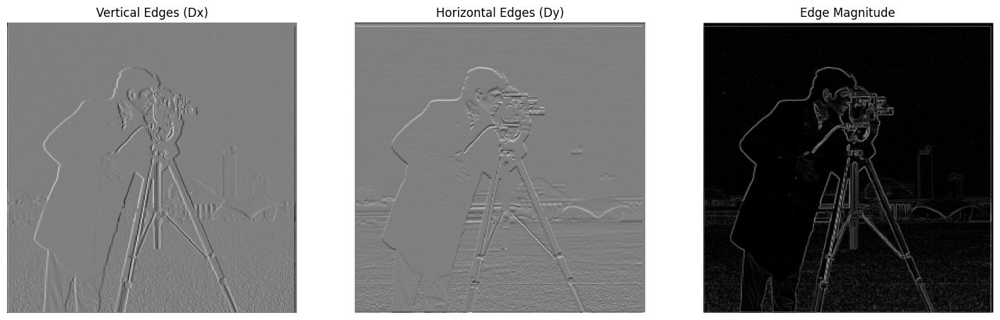

In [7]:
# finite difference operators
Dx = np.array([[-1, 0, 1]])
Dy = np.array([[-1], 
               [ 0], 
               [ 1]])
#sobel:
# Dx = np.array([
#     [1, 0, -1],
#     [2, 0, -2],
#     [1, 0, -1]
# ])

# Dy = np.array([
#     [1, 2, 1],
#     [0, 0, 0],
#     [-1, -2, -1]
# ])

cameraman_img = io.imread('cameraman.png', as_gray=True)
# cameraman_img = color.rgb2gray(cameraman_img) # cnv gray
edges_x = convolve2d(cameraman_img, Dx, mode='same', boundary='fill', fillvalue=0)
edges_y = convolve2d(cameraman_img, Dy, mode='same', boundary='fill', fillvalue=0)

edge_magnitude = np.sqrt(edges_x**2 + edges_y**2)


print("Created Dx and Dy filters and convolved with image to find edges.")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(edges_x, cmap='gray')
axes[0].set_title('Vertical Edges (Dx)')
axes[1].imshow(edges_y, cmap='gray')
axes[1].set_title('Horizontal Edges (Dy)')
axes[2].imshow(edge_magnitude, cmap='gray')
axes[2].set_title('Edge Magnitude')
for ax in axes:
    ax.axis('off')
plt.show()

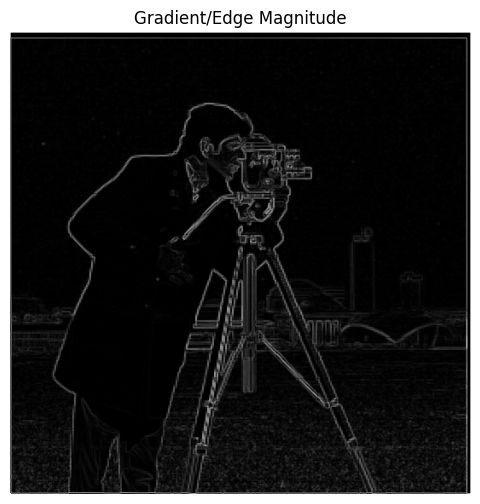

In [8]:
edge_magnitude = edge_magnitude/np.max(edge_magnitude) #norm
plt.figure(figsize=(6,6))
plt.imshow(edge_magnitude, cmap='gray')
plt.title('Gradient/Edge Magnitude')
plt.axis('off')
plt.show()

Binarized the magnitude image with a threshold of 0.25.


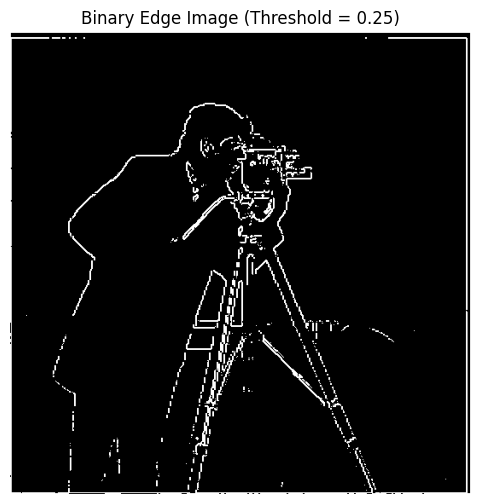

In [9]:
# Binarize with a Threshold
""" 
 We select a threshold value; any pixel with a gradient magnitude above this threshold is 
 considered an edge (set to 1 or white), and any pixel below it is not an edge 
 (set to 0 or black). Finding the right threshold is a process of trial and error. 
 A low threshold might include a lot of noise, while a high threshold might miss faint 
 but important edges.
"""
threshold = 0.25
edge_image = edge_magnitude > threshold

print(f"Binarized the magnitude image with a threshold of {threshold}.")

plt.figure(figsize=(6,6))
plt.imshow(edge_image, cmap='gray')
plt.title(f'Binary Edge Image (Threshold = {threshold})')
plt.axis('off')
plt.show()

Binarized the magnitude image with a threshold of 0.5.


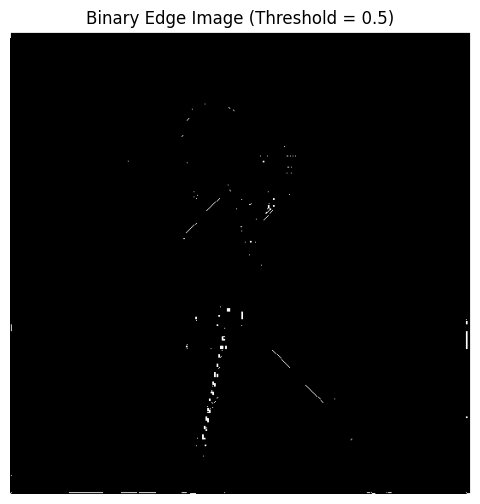

In [10]:
threshold = 0.5
edge_image = edge_magnitude > threshold

print(f"Binarized the magnitude image with a threshold of {threshold}.")

plt.figure(figsize=(6,6))
plt.imshow(edge_image, cmap='gray')
plt.title(f'Binary Edge Image (Threshold = {threshold})')
plt.axis('off')
plt.show()

Binarized the magnitude image with a threshold of 0.1.


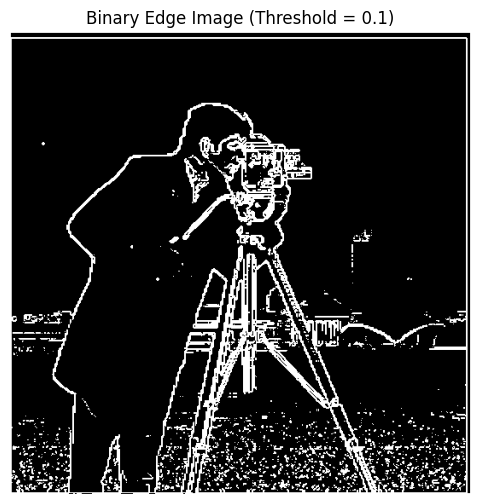

In [11]:
threshold = 0.10
edge_image = edge_magnitude > threshold

print(f"Binarized the magnitude image with a threshold of {threshold}.")

plt.figure(figsize=(6,6))
plt.imshow(edge_image, cmap='gray')
plt.title(f'Binary Edge Image (Threshold = {threshold})')
plt.axis('off')
plt.show()

Binarized the magnitude image with a threshold of 0.15.


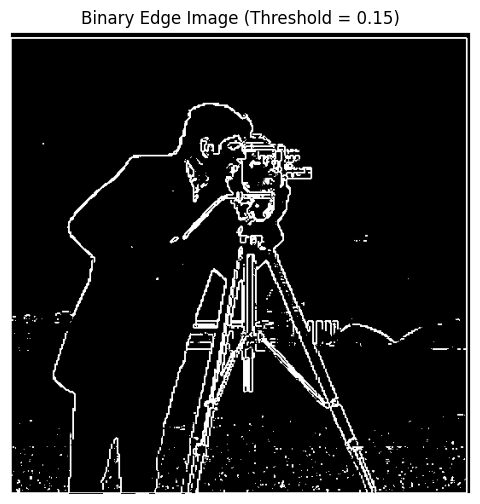

In [12]:
threshold = 0.15
edge_image = edge_magnitude > threshold

print(f"Binarized the magnitude image with a threshold of {threshold}.")

plt.figure(figsize=(6,6))
plt.imshow(edge_image, cmap='gray')
plt.title(f'Binary Edge Image (Threshold = {threshold})')
plt.axis('off')
plt.show()

Binarized the magnitude image with a threshold of 0.12.


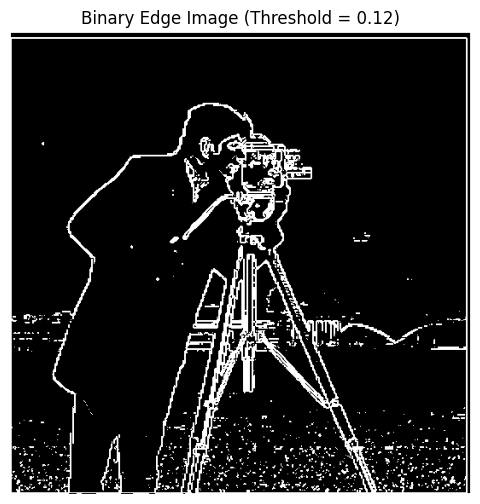

In [13]:
threshold = 0.12
edge_image = edge_magnitude > threshold

print(f"Binarized the magnitude image with a threshold of {threshold}.")

plt.figure(figsize=(6,6))
plt.imshow(edge_image, cmap='gray')
plt.title(f'Binary Edge Image (Threshold = {threshold})')
plt.axis('off')
plt.show()

Part 1.3: Derivative of Gaussian (DoG) Filter
We noted that the results with just the difference operator were rather noisy. Luckily, we have a smoothing operator handy: the Gaussian filter G. Create a blurred version of the original image by convolving with a gaussian and repeat the procedure in the previous part (one way to create a 2D gaussian filter is by using cv2.getGaussianKernel() to create a 1D gaussian and then taking an outer product with its transpose to get a 2D gaussian kernel).

What differences do you see?
Now we can do the same thing with a single convolution instead of two by creating a derivative of gaussian filters. Convolve the gaussian with D_x and D_y and display the resulting DoG filters as images.

Verify that you get the same result as before.


C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\4084246871.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(convolved_gauss_img)
C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\4084246871.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


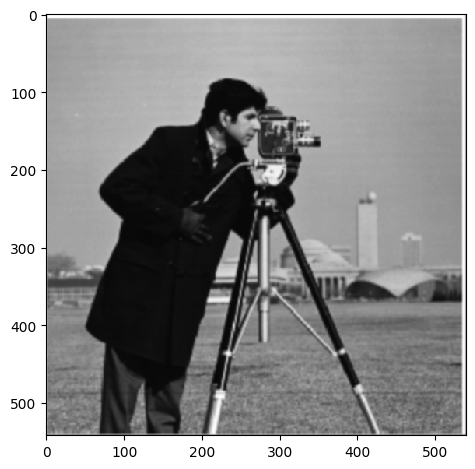

In [14]:
def gaussian_convolve(image):
    gaussian1d = cv2.getGaussianKernel(9, 1)
    gaussian2d = np.outer(gaussian1d, gaussian1d.T)

    convoled_img = convolve2d(image, gaussian2d, mode='same', boundary='fill', fillvalue=0)
    return convoled_img

convolved_gauss_img = gaussian_convolve(cameraman_img)
im_out_uint8 = (np.clip(convolved_gauss_img, 0, 1) * 255).astype(np.uint8)

fname = 'cameraman_gaussian.jpg'
# skio.imsave(fname, im_out)
skio.imsave(fname, im_out_uint8)

# display the image
skio.imshow(convolved_gauss_img)
skio.show()

Created Dx and Dy filters and convolved with image to find edges.


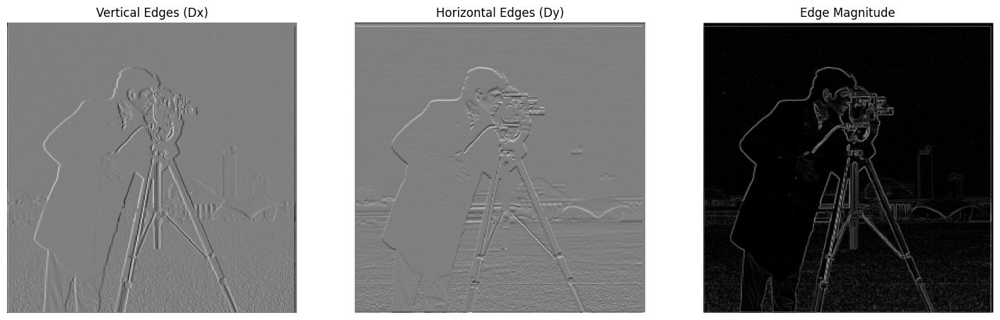

In [ ]:
# Convolve the gaussian with D_x and D_y and display the resulting DoG filters as images.
# def gaussian_single_convolve(image):
#     gaussian1d = cv2.getGaussianKernel(9, 1)
#     # gaussian2d = np.outer(gaussian1d, gaussian1d.T)

#     convoled_img = convolve2d(image, gaussian2d, mode='same', boundary='fill', fillvalue=0)
#     return convoled_img


gaussian1d = cv2.getGaussianKernel(9, 1)
dog_x = convolve2d(gaussian1d, Dx) 
dog_y = convolve2d(gaussian1d, Dy) 

dog_magnitude = np.sqrt(edges_x**2 + edges_y**2)


print("Created Dx and Dy filters and convolved with image to find edges.")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(edges_x, cmap='gray')
axes[0].set_title('Vertical Edges (Dx)')
axes[1].imshow(edges_y, cmap='gray')
axes[1].set_title('Horizontal Edges (Dy)')
axes[2].imshow(edge_magnitude, cmap='gray')
axes[2].set_title('Edge Magnitude')
for ax in axes:
    ax.axis('off')
plt.show()



# convolved_gauss_img = gaussian_convolve(cameraman_img)
# im_out_uint8 = (np.clip(convolved_gauss_img, 0, 1) * 255).astype(np.uint8)

# fname = 'cameraman_gaussian.jpg'
# # skio.imsave(fname, im_out)
# skio.imsave(fname, im_out_uint8)

# # display the image
# skio.imshow(blurred_image)
# skio.show()

Created Dx and Dy filters and convolved with image to find edges.


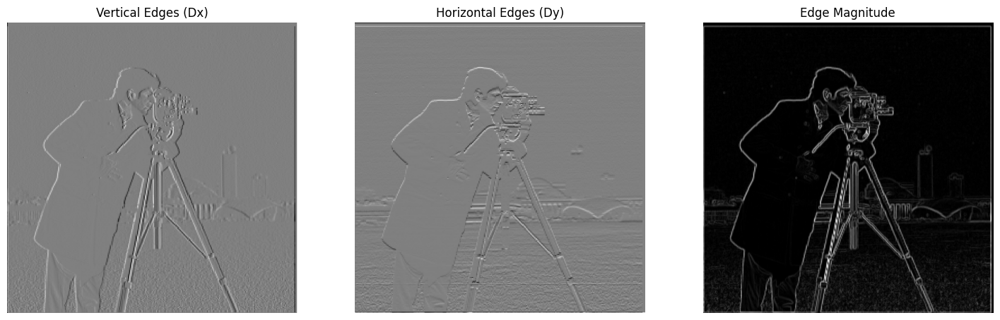

In [ ]:
img_x_dog = convolve2d(cameraman_img, dog_x, mode='same', boundary='symm')
img_y_dog = convolve2d(cameraman_img, dog_y, mode='same', boundary='symm')

magnitude_dog = np.sqrt(img_x_dog**2 + img_y_dog**2)
magnitude_dog /= np.max(magnitude_dog)



print("Created Dx and Dy filters and convolved with image to find edges.")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(edges_x, cmap='gray')
axes[0].set_title('Vertical Edges (Dx)')
axes[1].imshow(edges_y, cmap='gray')
axes[1].set_title('Horizontal Edges (Dy)')
axes[2].imshow(magnitude_dog, cmap='gray')
axes[2].set_title('Edge Magnitude')
for ax in axes:
    ax.axis('off')
plt.show()

Part 2: Fun with Frequencies!


C:\Users\Hilla\AppData\Local\Temp\ipykernel_31872\842677810.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  I = imread("taj.jpg") / 255.0


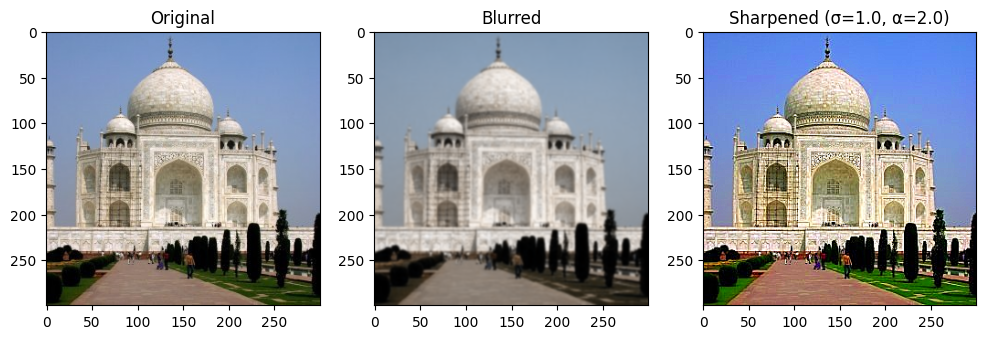

In [2]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from imageio import imread

# Load image (convert to float [0,1])
I = imread("taj.jpg") / 255.0  

# Parameters
sigma = 1.0   # Gaussian blur sigma
alpha = 2.0   # Sharpening strength
k = 3         # (can be used if you want an explicit kernel size)

# Step 1: Blur the image
I_blur = gaussian_filter(I, sigma=sigma, truncate=k/(2*sigma))

# Step 2: Add high frequencies
I_sharp = I + alpha * (I - I_blur)

# Step 3: Clip values to [0,1]
I_sharp = np.clip(I_sharp, 0, 1)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I, cmap='gray'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(I_blur, cmap='gray'); plt.title("Blurred")
plt.subplot(1,3,3); plt.imshow(I_sharp, cmap='gray'); plt.title(f"Sharpened (σ={sigma}, α={alpha})")
plt.show()

C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\3883022566.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  I = imread("warthog.jpg") / 255.0


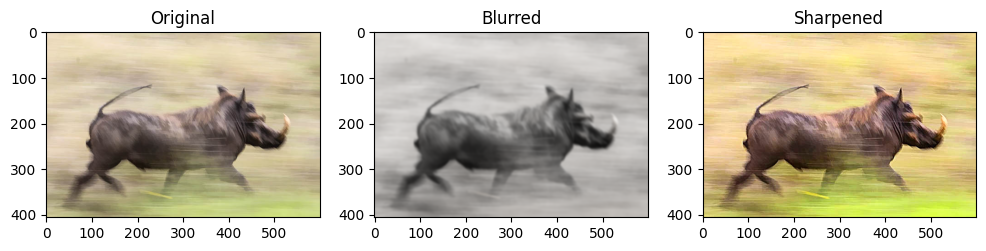

In [ ]:
# Part 2.1: Image "Sharpening"
#  unsharp masking technique
# add a little bit more high frequencies to the image
#  Combine this into a single convolution operation - the unsharp mask filter

import numpy as np
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from imageio import imread

# Load image (grayscale for simplicity)
I = imread("warthog.jpg") / 255.0  

sigma = 2.0   # Gaussian blur strength
alpha = 1.0   # Sharpening amount

# Step 1: Blur image
I_blur = gaussian_filter(I, sigma=sigma)

# Step 2: Extract high frequencies
high = I - I_blur

# Step 3: Sharpen
I_sharp = I + alpha * high
I_sharp = np.clip(I_sharp, 0, 1)

# Show results
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I, cmap='gray'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(I_blur, cmap='gray'); plt.title("Blurred")
plt.subplot(1,3,3); plt.imshow(I_sharp, cmap='gray'); plt.title("Sharpened")
plt.show()



C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\431278982.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  I = imread("impala.jpg") / 255.0


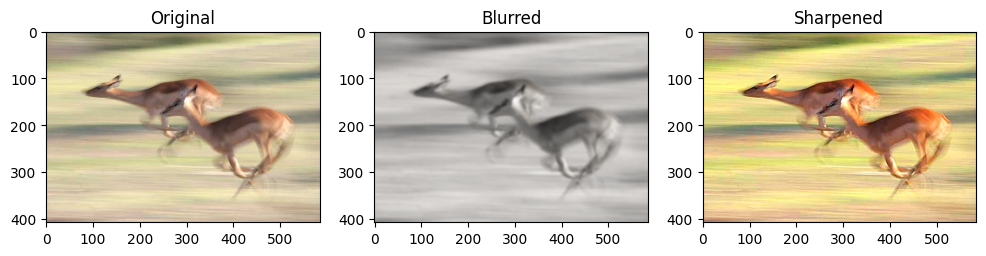

In [21]:
# Part 2.1: Image "Sharpening"
#  unsharp masking technique
# add a little bit more high frequencies to the image
#  Combine this into a single convolution operation - the unsharp mask filter

import numpy as np
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from imageio import imread

# Load image (grayscale for simplicity)
I = imread("impala.jpg") / 255.0  

# Parameters
sigma = 2.0   # Gaussian blur strength
alpha = 1.0   # Sharpening amount

# Step 1: Blur image
I_blur = gaussian_filter(I, sigma=sigma)

# Step 2: Extract high frequencies
high = I - I_blur

# Step 3: Sharpen
I_sharp = I + alpha * high
I_sharp = np.clip(I_sharp, 0, 1)

# Show results
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I, cmap='gray'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(I_blur, cmap='gray'); plt.title("Blurred")
plt.subplot(1,3,3); plt.imshow(I_sharp, cmap='gray'); plt.title("Sharpened")
plt.show()



C:\Users\Hilla\AppData\Local\Temp\ipykernel_34368\3239943355.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  I = imread("penguin_on_rock.jpg") / 255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


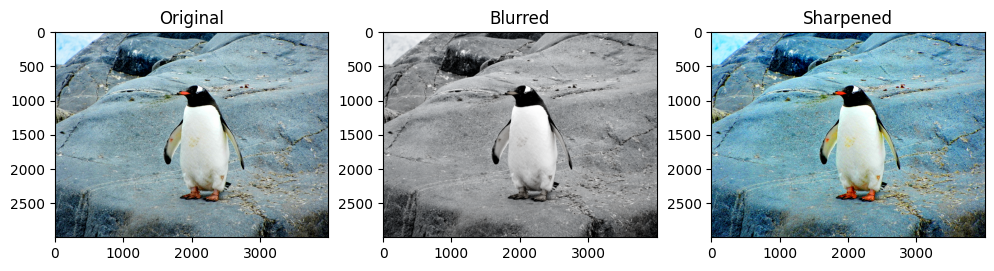

In [22]:
# Part 2.1: Image "Sharpening"
#  unsharp masking technique
# add a little bit more high frequencies to the image
#  Combine this into a single convolution operation - the unsharp mask filter

import numpy as np
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from imageio import imread

# Load image (grayscale for simplicity)
I = imread("penguin_on_rock.jpg") / 255.0  

sigma = 2.0   # Gaussian blur strength
alpha = 1.0   # Sharpening amount

# Step 1: Blur image
I_blur = gaussian_filter(I, sigma=sigma)

# Step 2: Extract high frequencies
high = I - I_blur

# Step 3: Sharpen
I_sharp = I + alpha * high
I_sharp = np.clip(I_sharp, 0, 1)

# Show results
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I, cmap='gray'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(I_blur, cmap='gray'); plt.title("Blurred")
plt.subplot(1,3,3); plt.imshow(I_sharp, cmap='gray'); plt.title("Sharpened")
plt.show()



In [4]:
import numpy as np
from scipy.signal import convolve2d
from skimage import data, io
import matplotlib.pyplot as plt

# --- Load a blurry image (using a built-in one for this example) ---
# In your code, you would use: io.imread('your_blurry_image.tif')
image = imread("taj.jpg") / 255.0  
# Let's artificially blur it to simulate a blurry input
ksize = 15
sigma = 2.5
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel_2d = np.outer(g_1d, g_1d)
gaussian_kernel_2d /= np.sum(gaussian_kernel_2d)
blurry_image = convolve2d(image, gaussian_kernel_2d, mode='same', boundary='symm')
blurry_image /= 255.0

# --- 1. Create a slightly less blurry version for our "low pass" image ---
# The sharpening kernel should be smaller than the blur we are trying to undo
ksize_sharp = 9
sigma_sharp = 1.5
x_s = np.arange(-ksize_sharp // 2 + 1., ksize_sharp // 2 + 1.)
g_1d_s = np.exp(-((x_s**2) / (2.0*sigma_sharp**2)))
gaussian_sharp = np.outer(g_1d_s, g_1d_s)
gaussian_sharp /= np.sum(gaussian_sharp)

low_pass = convolve2d(blurry_image, gaussian_sharp, mode='same', boundary='symm')

# --- 2. Isolate high frequencies (the "mask") ---
high_pass_mask = blurry_image - low_pass

# --- 3. Add the mask back to the original blurry image ---
alpha = 1.5 # Sharpening strength
sharpened_image_multistep = blurry_image + alpha * high_pass_mask

print("Sharpened image using the multi-step process.")

# Visualization
# fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(blurry_image, cmap='gray')
axes[0].set_title('Original Blurry Image')
axes[1].imshow(high_pass_mask, cmap='gray')
axes[1].set_title('High-Pass Mask (Details)')
axes[2].imshow(np.clip(sharpened_image_multistep, 0, 1), cmap='gray')
axes[2].set_title('Sharpened Image (Multi-Step)')
for ax in axes: ax.axis('off')
plt.show()


"""

Step 2: Deriving and Using a Single Unsharp Mask Filter
The multi-step process is inefficient because it requires two convolutions on the full image. We can combine it into a single filter. Let `I` be the image, `G` be the Gaussian kernel, and `δ` be the identity kernel (a single 1 at the center, which does nothing when convolved).

Sharpened = I + α * (I - I * G)
Sharpened = I * δ + α * (I * δ - I * G)
Sharpened = I * (δ + α * (δ - G))
Sharpened = I * ((1 + α)δ - αG)

The term `(1 + α)δ - αG` is our final **unsharp mask filter**. We can create this small filter and apply it in one convolution.

# --- Create the single unsharp mask filter ---
# 1. Create the identity kernel (must be same size as Gaussian)
identity_kernel = np.zeros_like(gaussian_sharp)
identity_kernel[ksize_sharp // 2, ksize_sharp // 2] = 1.0

# 2. Combine using the formula: (1 + alpha) * identity - alpha * gaussian
alpha = 1.5
unsharp_mask_filter = (1 + alpha) * identity_kernel - alpha * gaussian_sharp

# --- Apply the single filter to the blurry image ---
sharpened_image_onestep = convolve2d(blurry_image, unsharp_mask_filter, mode='same', boundary='symm')

# --- Verification ---
print(f"Results from one-step and multi-step are the same: {np.allclose(sharpened_image_multistep, sharpened_image_onestep)}")

# Visualization
# fig, axes = plt.subplots(1, 2, figsize=(12, 6))
# axes[0].imshow(blurry_image, cmap='gray', vmin=0, vmax=1)
# axes[0].set_title('Original Blurry Image')
# axes[1].imshow(np.clip(sharpened_image_onestep, 0, 1), cmap='gray', vmin=0, vmax=1)
# axes[1].set_title('Sharpened with Single Filter')
# for ax in axes: ax.axis('off')
# plt.show()
"""

C:\Users\Hilla\AppData\Local\Temp\ipykernel_31872\972152217.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread("taj.jpg") / 255.0


ValueError: convolve2d inputs must both be 2-D arrays

In [7]:
import numpy as np
from scipy.signal import convolve2d
from skimage import data, io, color
import matplotlib.pyplot as plt

# --- Load a blurry image ---
try:
    # Attempt to load the user-provided image
    original_image = io.imread('blurry_image.tif') 
except FileNotFoundError:
    print("Warning: 'blurry_image.tif' not found. Using a fallback example.")
    original_image = data.chelsea() # Fallback to a color image of a cat

# --- Ensure the image is 2D Grayscale for this example ---
if original_image.ndim == 3:
    image_gray = color.rgb2gray(original_image)
else:
    image_gray = original_image

# Normalize to [0, 1] if it's not already
if image_gray.max() > 1.0:
    image_gray = image_gray / 255.0

# --- 1. Create Gaussian kernel for low-pass version ---
ksize_sharp = 9
sigma_sharp = 1.5
x_s = np.arange(-ksize_sharp // 2 + 1., ksize_sharp // 2 + 1.)
g_1d_s = np.exp(-((x_s**2) / (2.0*sigma_sharp**2)))
gaussian_sharp = np.outer(g_1d_s, g_1d_s)
gaussian_sharp /= np.sum(gaussian_sharp)

low_pass = convolve2d(image_gray, gaussian_sharp, mode='same', boundary='symm')

# --- 2. Isolate high frequencies (the "mask") ---
high_pass_mask = image_gray - low_pass

# --- 3. Add the mask back to the original image ---
alpha = 1.5 # Sharpening strength
sharpened_image_multistep = image_gray + alpha * high_pass_mask

print("Sharpened grayscale image using the multi-step process.")

Sharpened grayscale image using the multi-step process.


In [8]:
identity_kernel = np.zeros_like(gaussian_sharp)
identity_kernel[ksize_sharp // 2, ksize_sharp // 2] = 1.0
alpha = 1.5

unsharp_mask_filter = (1 + alpha) * identity_kernel - alpha * gaussian_sharp

# --- Apply the single filter to the grayscale image ---
sharpened_image_onestep = convolve2d(image_gray, unsharp_mask_filter, mode='same', boundary='symm')

print(f"Results from one-step and multi-step are the same: {np.allclose(sharpened_image_multistep, sharpened_image_onestep)}")

Results from one-step and multi-step are the same: True


Also for evaluation, pick a sharp image, blur it and then try to sharpen it again. Compare the original and the sharpened image and report your observations.

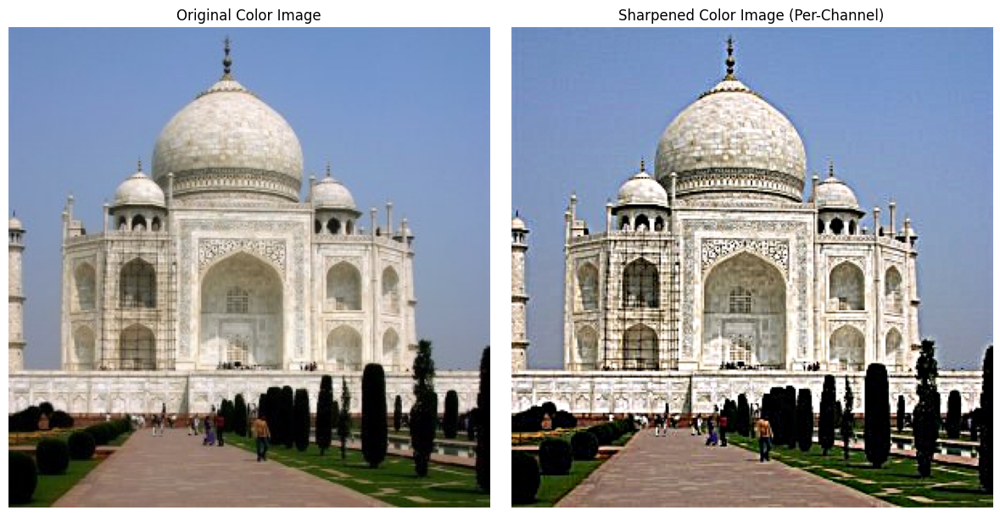

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, data
from scipy.signal import convolve2d

# --- 1. SETUP: Load Color Image and Define Parameters ---

# Try to load the user's image, otherwise use a standard one
# try:
#     # Make sure 'blurry_image.tif' is in the same directory as your script
#     target_color = io.imread('blurry_image.tif')
# except FileNotFoundError:
#     print("Info: 'blurry_image.tif' not found. Using a standard test image instead.")
#     target_color = data.chelsea()

target_color = image
# Normalize the color image to the range [0.0, 1.0]
if target_color.max() > 1:
    target_color_float = target_color / 255.0
else:
    target_color_float = target_color

# Define the sharpening factor 'alpha'
alpha = 1.5


# --- 2. SEPARATE THE RGB CHANNELS ---

# A color image is a 3D NumPy array (height, width, 3).
# We can slice it to get each 2D channel.
r_channel = target_color_float[:, :, 0]
g_channel = target_color_float[:, :, 1]
b_channel = target_color_float[:, :, 2]


# --- 3. SHARPEN EACH CHANNEL INDIVIDUALLY ---

# Create the Gaussian kernel (this is the same for all channels)
sigma = 2.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for channel in [r_channel, g_channel, b_channel]:
    # Apply the exact same unsharp mask logic as the grayscale version
    blurred_channel = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_channel = channel - blurred_channel
    sharpened_channel = channel + alpha * details_channel

    # Add the sharpened result for this channel to our list
    sharpened_channels.append(sharpened_channel)


# --- 4. RECOMBINE THE SHARPENED CHANNELS ---

# Stack the list of 2D arrays back into a single 3D array
# axis=2 (or -1) stacks them along the color dimension
result_color = np.stack(sharpened_channels, axis=2)

# IMPORTANT: Clip the final result to the valid [0, 1] range
result_color_clipped = np.clip(result_color, 0, 1)


# --- 5. VISUALIZATION ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(target_color_float)
axes[0].set_title('Original Color Image')
axes[0].axis('off')

axes[1].imshow(result_color_clipped)
axes[1].set_title(f'Sharpened Color Image (Per-Channel)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

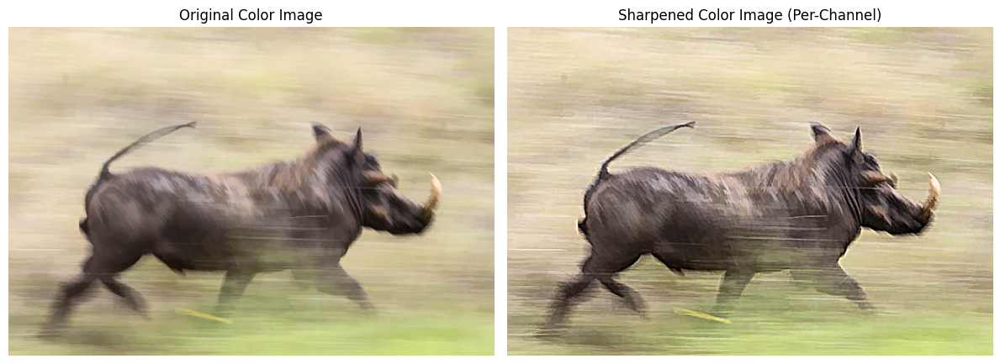

In [13]:

target_color = io.imread('warthog.jpg')
# Normalize the color image to the range [0.0, 1.0]
if target_color.max() > 1:
    target_color_float = target_color / 255.0
else:
    target_color_float = target_color

# Define the sharpening factor 'alpha'
alpha = 1.5


# --- 2. SEPARATE THE RGB CHANNELS ---

# A color image is a 3D NumPy array (height, width, 3).
# We can slice it to get each 2D channel.
r_channel = target_color_float[:, :, 0]
g_channel = target_color_float[:, :, 1]
b_channel = target_color_float[:, :, 2]


# --- 3. SHARPEN EACH CHANNEL INDIVIDUALLY ---

# Create the Gaussian kernel (this is the same for all channels)
sigma = 2.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for channel in [r_channel, g_channel, b_channel]:
    # Apply the exact same unsharp mask logic as the grayscale version
    blurred_channel = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_channel = channel - blurred_channel
    sharpened_channel = channel + alpha * details_channel

    # Add the sharpened result for this channel to our list
    sharpened_channels.append(sharpened_channel)


# --- 4. RECOMBINE THE SHARPENED CHANNELS ---

# Stack the list of 2D arrays back into a single 3D array
# axis=2 (or -1) stacks them along the color dimension
result_color = np.stack(sharpened_channels, axis=2)

# IMPORTANT: Clip the final result to the valid [0, 1] range
result_color_clipped = np.clip(result_color, 0, 1)


# --- 5. VISUALIZATION ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(target_color_float)
axes[0].set_title('Original Color Image')
axes[0].axis('off')

axes[1].imshow(result_color_clipped)
axes[1].set_title(f'Sharpened Color Image (Per-Channel)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

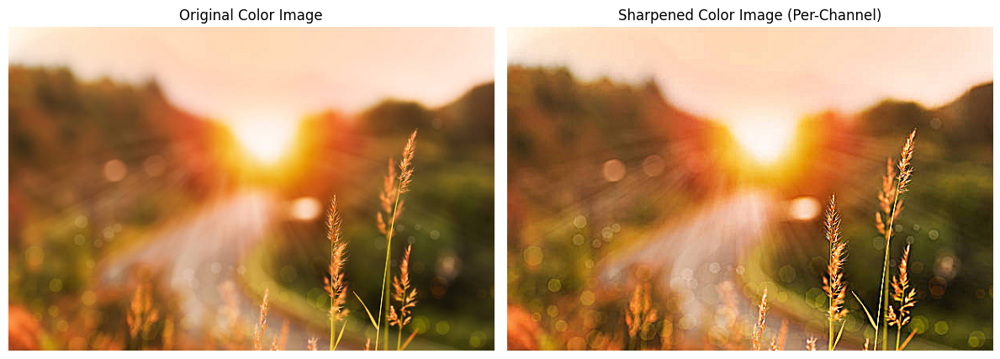

In [15]:

target_color = io.imread('mountain_road.jpg')
# Normalize the color image to the range [0.0, 1.0]
if target_color.max() > 1:
    target_color_float = target_color / 255.0
else:
    target_color_float = target_color

# Define the sharpening factor 'alpha'
alpha = 1.5


# --- 2. SEPARATE THE RGB CHANNELS ---

# A color image is a 3D NumPy array (height, width, 3).
# We can slice it to get each 2D channel.
r_channel = target_color_float[:, :, 0]
g_channel = target_color_float[:, :, 1]
b_channel = target_color_float[:, :, 2]


# --- 3. SHARPEN EACH CHANNEL INDIVIDUALLY ---

# Create the Gaussian kernel (this is the same for all channels)
sigma = 2.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for channel in [r_channel, g_channel, b_channel]:
    # Apply the exact same unsharp mask logic as the grayscale version
    blurred_channel = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_channel = channel - blurred_channel
    sharpened_channel = channel + alpha * details_channel

    # Add the sharpened result for this channel to our list
    sharpened_channels.append(sharpened_channel)


# --- 4. RECOMBINE THE SHARPENED CHANNELS ---

# Stack the list of 2D arrays back into a single 3D array
# axis=2 (or -1) stacks them along the color dimension
result_color = np.stack(sharpened_channels, axis=2)

# IMPORTANT: Clip the final result to the valid [0, 1] range
result_color_clipped = np.clip(result_color, 0, 1)


# --- 5. VISUALIZATION ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(target_color_float)
axes[0].set_title('Original Color Image')
axes[0].axis('off')

axes[1].imshow(result_color_clipped)
axes[1].set_title(f'Sharpened Color Image (Per-Channel)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

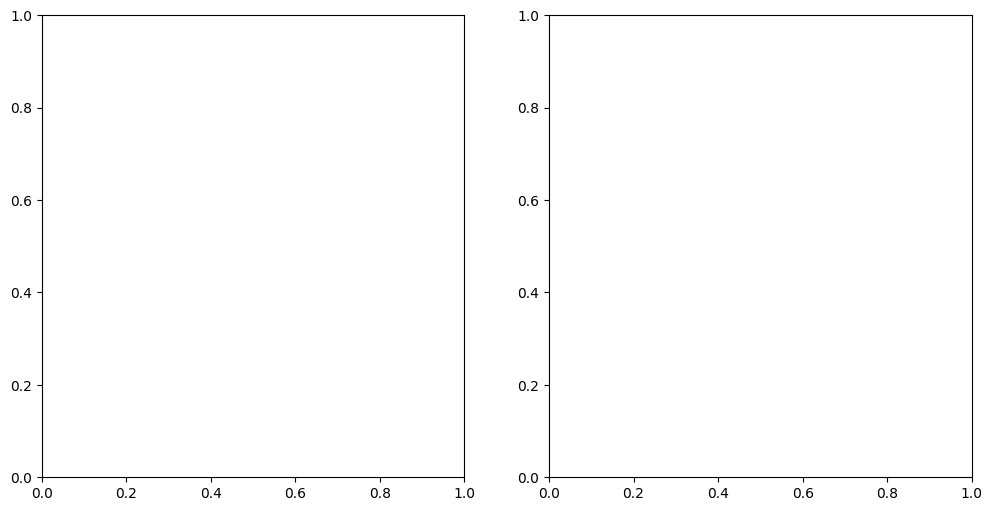

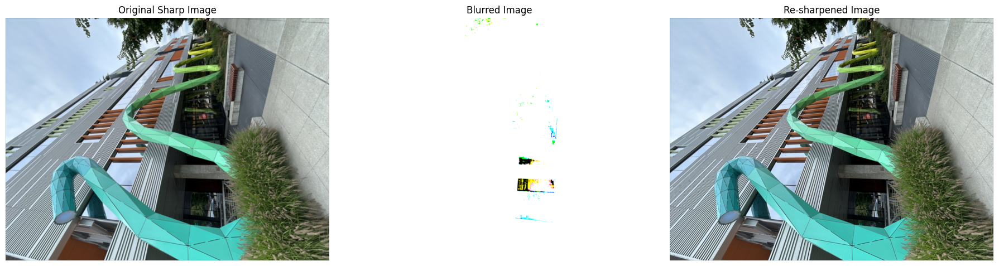

In [24]:

target_color = io.imread('serpent.jpg')

#Also for evaluation, pick a sharp image, blur it and then try to sharpen it again. Compare the original and the sharpened image and report your observations.

box_filter_size = 9
box_filter = np.ones((box_filter_size, box_filter_size)) / (box_filter_size ** 2)

blurred_channels = []
for c in range(3):
    channel = target_color[:, :, c]  # pick R, G, or B
    blurred_c = convolve2d(channel, box_filter, mode='same', boundary='fill', fillvalue=0)
    blurred_channels.append(blurred_c)

# Recombine into a color image
# blurred_image = np.stack(blurred_channels, axis=2)

# # Convert to uint8
# im_out_uint8 = (np.clip(blurred_image, 0, 1) * 255).astype(np.uint8)
# target_color = im_out_uint8
blurred_image = np.stack(blurred_channels, axis=2)

# Clip to valid uint8 range
target_color = np.clip(blurred_image, 0, 255).astype(np.uint8)


# Normalize the color image to the range [0.0, 1.0]
if target_color.max() > 1:
    target_color_float = target_color / 255.0
else:
    target_color_float = target_color

# Define the sharpening factor 'alpha'
alpha = 1.5


# --- 2. SEPARATE THE RGB CHANNELS ---

# A color image is a 3D NumPy array (height, width, 3).
# We can slice it to get each 2D channel.
r_channel = target_color_float[:, :, 0]
g_channel = target_color_float[:, :, 1]
b_channel = target_color_float[:, :, 2]


# --- 3. SHARPEN EACH CHANNEL INDIVIDUALLY ---

# Create the Gaussian kernel (this is the same for all channels)
sigma = 2.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for channel in [r_channel, g_channel, b_channel]:
    # Apply the exact same unsharp mask logic as the grayscale version
    blurred_channel = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_channel = channel - blurred_channel
    sharpened_channel = channel + alpha * details_channel

    # Add the sharpened result for this channel to our list
    sharpened_channels.append(sharpened_channel)


# --- 4. RECOMBINE THE SHARPENED CHANNELS ---

# Stack the list of 2D arrays back into a single 3D array
# axis=2 (or -1) stacks them along the color dimension
result_color = np.stack(sharpened_channels, axis=2)

# IMPORTANT: Clip the final result to the valid [0, 1] range
result_color_clipped = np.clip(result_color, 0, 1)


# --- 5. VISUALIZATION ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(target_color_float)
axes[0].set_title("Original Sharp Image")
axes[0].axis("off")

axes[1].imshow(np.clip(blurred_image, 0, 1))
axes[1].set_title("Blurred Image")
axes[1].axis("off")

axes[2].imshow(result_color_clipped)
axes[2].set_title("Re-sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


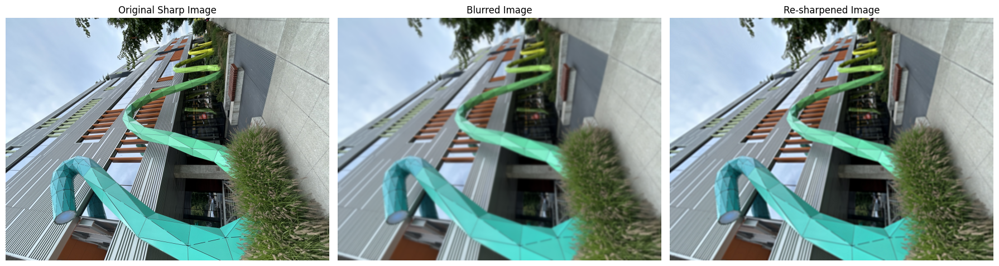

In [28]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# --- 1. Load original ---
original_color = io.imread('serpent.jpg')

# --- 2. Blur the image (per channel) ---# Stronger Gaussian blur kernel
sigma_blur = 10.0   # try 5, 10, etc.
ksize = int(6 * sigma_blur) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-(x**2) / (2.0 * sigma_blur**2))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

blurred_channels = []
for c in range(3):
    channel = original_color[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    blurred_channels.append(blurred_c)

blurred_color = np.stack(blurred_channels, axis=2)
blurred_color = np.clip(blurred_color, 0, 255).astype(np.uint8)

# --- 3. Normalize blurred image for sharpening ---
blurred_float = blurred_color.astype(np.float32) / 255.0

# --- 4. Sharpen using unsharp mask ---
alpha = 1.5
sigma = 9.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for c in range(3):
    channel = blurred_float[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_c = channel - blurred_c
    sharpened_c = channel + alpha * details_c
    sharpened_channels.append(sharpened_c)

resharpened_color = np.stack(sharpened_channels, axis=2)
resharpened_color = np.clip(resharpened_color, 0, 1)

# --- 5. Visualization ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(original_color)
axes[0].set_title("Original Sharp Image")
axes[0].axis("off")

axes[1].imshow(blurred_color)
axes[1].set_title("Blurred Image")
axes[1].axis("off")

axes[2].imshow(resharpened_color)
axes[2].set_title("Re-sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# --- 1. Load original ---
original_color = io.imread('serpent.jpg')

# --- 2. Blur the image (per channel) ---# Stronger Gaussian blur kernel
sigma_blur = 10.0   # try 5, 10, etc.
ksize = int(6 * sigma_blur) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-(x**2) / (2.0 * sigma_blur**2))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

blurred_channels = []
for c in range(3):
    channel = original_color[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    blurred_channels.append(blurred_c)

blurred_color = np.stack(blurred_channels, axis=2)
blurred_color = np.clip(blurred_color, 0, 255).astype(np.uint8)

# --- 3. Normalize blurred image for sharpening ---
blurred_float = blurred_color.astype(np.float32) / 255.0

# --- 4. Sharpen using unsharp mask ---
alpha = 1.5
sigma = 3.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for c in range(3):
    channel = blurred_float[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_c = channel - blurred_c
    sharpened_c = channel + alpha * details_c
    sharpened_channels.append(sharpened_c)

resharpened_color = np.stack(sharpened_channels, axis=2)
resharpened_color = np.clip(resharpened_color, 0, 1)

# --- 5. Visualization ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(original_color)
axes[0].set_title("Original Sharp Image")
axes[0].axis("off")

axes[1].imshow(blurred_color)
axes[1].set_title("Blurred Image")
axes[1].axis("off")

axes[2].imshow(resharpened_color)
axes[2].set_title("Re-sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


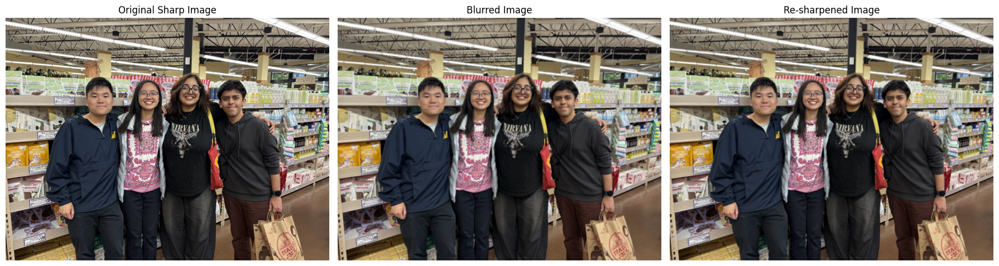

In [26]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# --- 1. Load original ---
original_color = io.imread('trader_joes.jpg')

# --- 2. Blur the image (per channel) ---# Stronger Gaussian blur kernel
sigma_blur = 5.0   # try 5, 10, etc.
ksize = int(6 * sigma_blur) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-(x**2) / (2.0 * sigma_blur**2))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

blurred_channels = []
for c in range(3):
    channel = original_color[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    blurred_channels.append(blurred_c)

blurred_color = np.stack(blurred_channels, axis=2)
blurred_color = np.clip(blurred_color, 0, 255).astype(np.uint8)

# --- 3. Normalize blurred image for sharpening ---
blurred_float = blurred_color.astype(np.float32) / 255.0

# --- 4. Sharpen using unsharp mask ---
alpha = 1.5
sigma = 2.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for c in range(3):
    channel = blurred_float[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_c = channel - blurred_c
    sharpened_c = channel + alpha * details_c
    sharpened_channels.append(sharpened_c)

resharpened_color = np.stack(sharpened_channels, axis=2)
resharpened_color = np.clip(resharpened_color, 0, 1)

# --- 5. Visualization ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(original_color)
axes[0].set_title("Original Sharp Image")
axes[0].axis("off")

axes[1].imshow(blurred_color)
axes[1].set_title("Blurred Image")
axes[1].axis("off")

axes[2].imshow(resharpened_color)
axes[2].set_title("Re-sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


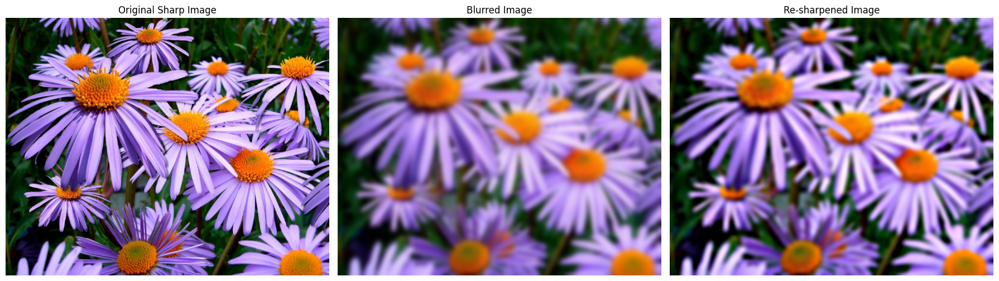

In [33]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# --- 1. Load original ---
original_color = io.imread('purple_flowers.jpeg')

# --- 2. Blur the image (per channel) ---# Stronger Gaussian blur kernel
sigma_blur = 7.0   # try 5, 10, etc.
ksize = int(6 * sigma_blur) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-(x**2) / (2.0 * sigma_blur**2))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

blurred_channels = []
for c in range(3):
    channel = original_color[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    blurred_channels.append(blurred_c)

blurred_color = np.stack(blurred_channels, axis=2)
blurred_color = np.clip(blurred_color, 0, 255).astype(np.uint8)

# --- 3. Normalize blurred image for sharpening ---
blurred_float = blurred_color.astype(np.float32) / 255.0

# --- 4. Sharpen using unsharp mask ---
alpha = 1.5
sigma = 9.0
ksize = int(6 * sigma) + 1
if ksize % 2 == 0: ksize += 1
x = np.arange(-ksize // 2 + 1., ksize // 2 + 1.)
g_1d = np.exp(-((x**2) / (2.0*sigma**2)))
gaussian_kernel = np.outer(g_1d, g_1d)
gaussian_kernel /= np.sum(gaussian_kernel)

sharpened_channels = []
for c in range(3):
    channel = blurred_float[:, :, c]
    blurred_c = convolve2d(channel, gaussian_kernel, mode='same', boundary='symm')
    details_c = channel - blurred_c
    sharpened_c = channel + alpha * details_c
    sharpened_channels.append(sharpened_c)

resharpened_color = np.stack(sharpened_channels, axis=2)
resharpened_color = np.clip(resharpened_color, 0, 1)

# --- 5. Visualization ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(original_color)
axes[0].set_title("Original Sharp Image")
axes[0].axis("off")

axes[1].imshow(blurred_color)
axes[1].set_title("Blurred Image")
axes[1].axis("off")

axes[2].imshow(resharpened_color)
axes[2].set_title("Re-sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


STARTER CODE

Part 2.2: Hybrid Images - see hybrid_images folder


Multi-resolution Blending and the Oraple journey





In [6]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform as sktr

def gaussian_pyramid(image, levels=5):
    pyramid = [image.copy()]
    for _ in range(levels - 1):
        image = sktr.rescale(image, 0.5, anti_aliasing=True, channel_axis=-1)
        pyramid.append(image)
    return pyramid

def laplacian_pyramid(image, levels=5):
    gauss_pyr = gaussian_pyramid(image, levels)
    lap_pyr = []
    for i in range(levels - 1):
        upsampled = sktr.resize(gauss_pyr[i+1], gauss_pyr[i].shape, preserve_range=True, anti_aliasing=True)
        lap_level = gauss_pyr[i] - upsampled
        lap_pyr.append(lap_level)
    lap_pyr.append(gauss_pyr[-1])
    return lap_pyr

def collapse_pyramid(pyramid):
    """Collapses a Laplacian pyramid to reconstruct the image."""
    # Start with the smallest level of the pyramid
    image = pyramid[-1]
    # Iterate from the second to last level up to the first
    for i in range(len(pyramid) - 2, -1, -1):
        upsampled = sktr.resize(image, pyramid[i].shape)
        image = upsampled + pyramid[i]
    return np.clip(image, 0, 1)


def blend_images(image_a, image_b, mask, levels=5):
    """
    Blends two images using Laplacian pyramids and a Gaussian mask pyramid.
    """
    # 1. Build Laplacian pyramids for the input images
    lap_pyr_a = laplacian_pyramid(image_a, levels)
    lap_pyr_b = laplacian_pyramid(image_b, levels)

    # 2. Build a Gaussian pyramid for the mask
    mask_gauss_pyr = gaussian_pyramid(mask, levels)

    # 3. Combine the pyramids level by level
    blended_lap_pyr = []
    for i in range(levels):
        # Ensure mask is broadcastable for color images
        mask_level = mask_gauss_pyr[i]
        if len(mask_level.shape) == 2 and len(lap_pyr_a[i].shape) == 3:
             mask_level = np.stack([mask_level]*3, axis=-1)

        blended_level = (mask_level * lap_pyr_a[i] +
                         (1 - mask_level) * lap_pyr_b[i])
        blended_lap_pyr.append(blended_level)

    # 4. Collapse the resulting pyramid to get the final image
    return collapse_pyramid(blended_lap_pyr)

In [21]:
image_a = plt.imread('spline/apple.jpeg')[:, :, :3]
image_b = plt.imread('spline/orange.jpeg')[:, :, :3]
rows, cols, _ = image_a.shape

rows, cols, _ = image_a.shape
mask = np.zeros((rows, cols))

# define the seam position in middle (1/2 of image)
seam_position = cols // 2
mask[:, :seam_position] = 1

In [22]:
def same_size_pair(a, b):
    #Resize b to a's shape (height, width, channels)
    target_shape = a.shape
    if b.shape != target_shape:
        # resclae
        b = sktr.resize(b, target_shape, preserve_range=True, anti_aliasing=True)
    return a, b


def prepare_mask_for_level(mask, target_shape):
    #Resize mask to target (h,w) and return shape (h,w,1) with values [0,1]
    h, w = target_shape[:2]
    if mask.ndim == 3 and mask.shape[2] > 1:
        # If mask is RGB, convert to grayscale-like by averaging channels
        mask2 = np.mean(mask, axis=2)
    else:
        mask2 = mask.squeeze()
    resized = sktr.resize(mask2, (h, w), preserve_range=True, anti_aliasing=True)
    # ensure normalized 0-1
    resized = resized.astype(np.float32)
    if resized.max() > 1.0:
        resized = resized / 255.0
    resized = np.clip(resized, 0.0, 1.0)
    return resized[..., np.newaxis]  # (h,w,1)

def blend_images(image_a, image_b, mask, levels=6):
    # Ensure float and 0-1
    image_a = image_a.astype(np.float32) 
    if image_a.max() > 1.0:
        image_a = image_a / 255.0

    image_b = image_b.astype(np.float32) 
    if image_b.max() > 1.0:
        image_b = image_b / 255.0

    mask =  mask.astype(np.float32)
    if mask.max() > 1.0:
        mask = mask / 255.0

    image_a, image_b = same_size_pair(image_a, image_b) #resize to same pair
    # if mask is single channel or different size, resize once to match full resolution
    if mask.ndim == 2:
        mask_full = sktr.resize(mask, (image_a.shape[0], image_a.shape[1]), preserve_range=True, anti_aliasing=True)
    else:
        # if mask is colored(H,W,3), collapse to gray then resize
        mask_full = sktr.resize(mask[...,0] if mask.shape[2] == 1 else np.mean(mask, axis=2),
                                (image_a.shape[0], image_a.shape[1]), preserve_range=True, anti_aliasing=True)

    mask_full = np.clip(mask_full, 0.0, 1.0)
    mask_full = mask_full[..., np.newaxis]  # (H,W,1)

    # Laplacian pyramids for image A and B 
    levels = max(1, int(levels))
    lp_a = laplacian_pyramid(image_a, levels)
    lp_b = laplacian_pyramid(image_b, levels)

    # gaussian pyramid for mask 
    gp_mask = []
    cur_mask = mask_full
    gp_mask.append(cur_mask)
    for i in range(1, levels):
        h, w = max(1, cur_mask.shape[0] // 2), max(1, cur_mask.shape[1] // 2)
        cur_mask = sktr.resize(cur_mask.squeeze(), (h, w), preserve_range=True, anti_aliasing=True)
        cur_mask = np.clip(cur_mask, 0.0, 1.0)[..., np.newaxis]
        gp_mask.append(cur_mask)

    # Blend laplacian levels using mask levels
    blended_lp = []
    for i in range(levels):
        #  mask resized to laplacian level shape
        mask_level = prepare_mask_for_level(gp_mask[i], lp_a[i].shape)
        # mask_level is (h,w,1), laplacian levels are (h,w,c)
        if lp_a[i].shape != lp_b[i].shape:
            # resize lp_b[i] to lp_a[i] shape
            lp_b_i = sktr.resize(lp_b[i], lp_a[i].shape, preserve_range=True, anti_aliasing=True)
        else:
            lp_b_i = lp_b[i]

        blended_level = mask_level * lp_a[i] + (1.0 - mask_level) * lp_b_i
        blended_lp.append(blended_level)

    # collapse the pyramid, return clipped 0-1
    blended = collapse_pyramid(blended_lp)

    return blended


Resizing images to match Image A's shape: (300, 300, 3)
Generating Laplacian pyramid for the blended result


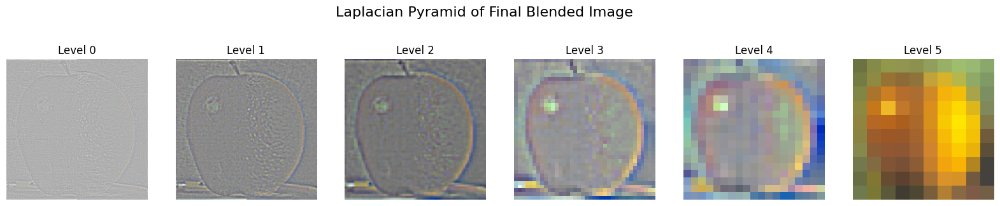

Generating Gauss pyramid for the blended result


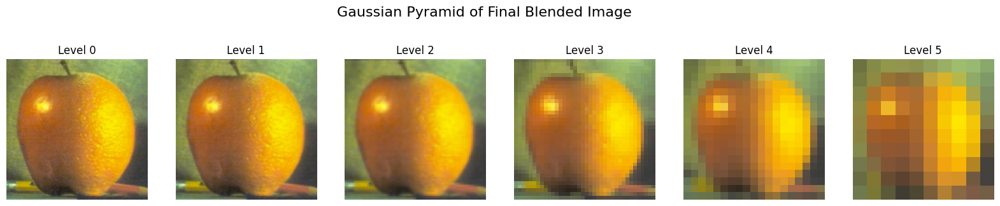

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


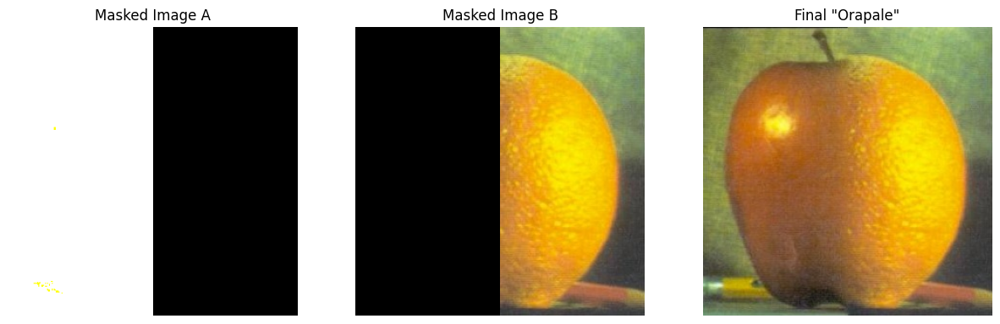

In [23]:
print(f"Resizing images to match Image A's shape: {image_a.shape}")
# Resize image_b to match image_a's shape
image_b = sktr.resize(image_b, image_a.shape)

#  ensure mask matches the 2D shape 
mask = sktr.resize(mask, (image_a.shape[0], image_a.shape[1]))

final_blend = blend_images(image_a, image_b, mask, levels=6)

print("Generating Laplacian pyramid for the blended result")
blended_lap_pyr = laplacian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Laplacian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_lap_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

print("Generating Gauss pyramid for the blended result")
blended_gaus_pyr = gaussian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Gaussian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_gaus_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(mask[:,:,np.newaxis] * image_a)
axes[0].set_title('Masked Image A')
axes[0].axis('off')
axes[1].imshow((1-mask[:,:,np.newaxis]) * image_b)
axes[1].set_title('Masked Image B')
axes[1].axis('off')
axes[2].imshow(final_blend)
axes[2].set_title('Final "Orapale"')
axes[2].axis('off')
plt.show()

My custom images

In [18]:
image_a = plt.imread('corolla.png')[:, :, :3]
image_b = plt.imread('camry.png')[:, :, :3]
rows, cols, _ = image_a.shape

rows, cols, _ = image_a.shape
mask = np.zeros((rows, cols))

# define the seam position in middle (1/2 of image)
seam_position = cols // 2
mask[:, :seam_position] = 1

Resizing images to match Image A's shape: (747, 1799, 3)
Generating Laplacian pyramid for the blended result


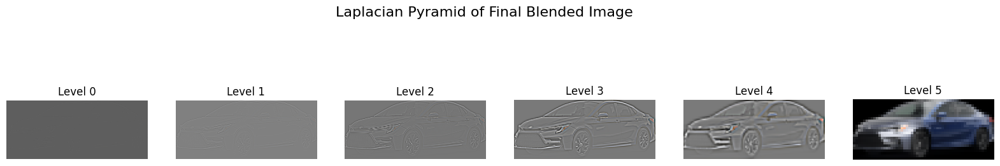

Generating Gauss pyramid for the blended result


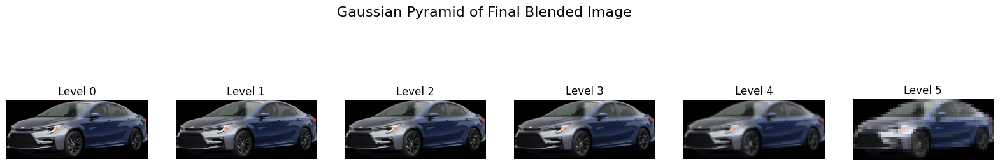

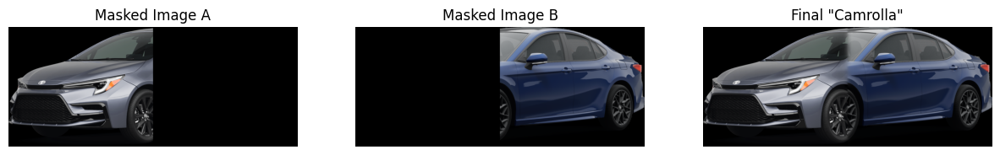

In [20]:
print(f"Resizing images to match Image A's shape: {image_a.shape}")
# Resize image_b to match image_a's shape
image_b = sktr.resize(image_b, image_a.shape)

#  ensure mask matches the 2D shape 
mask = sktr.resize(mask, (image_a.shape[0], image_a.shape[1]))

final_blend = blend_images(image_a, image_b, mask, levels=6)

print("Generating Laplacian pyramid for the blended result")
blended_lap_pyr = laplacian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Laplacian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_lap_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

print("Generating Gauss pyramid for the blended result")
blended_gaus_pyr = gaussian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Gaussian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_gaus_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(mask[:,:,np.newaxis] * image_a)
axes[0].set_title('Masked Image A')
axes[0].axis('off')
axes[1].imshow((1-mask[:,:,np.newaxis]) * image_b)
axes[1].set_title('Masked Image B')
axes[1].axis('off')
axes[2].imshow(final_blend)
axes[2].set_title('Final "Camrolla"')
axes[2].axis('off')
plt.show()

In [31]:
image_a = plt.imread('quokka.png')[:, :, :3]
image_b = plt.imread('penguin_resized.png')[:, :, :3]
rows, cols, _ = image_a.shape

rows, cols, _ = image_a.shape
# mask = plt.imread('ellipsis_mask_2.png')
# mask = rgb2gray(mask)
# if mask.ndim == 3:
#     mask = rgb2gray(mask)


from skimage.color import rgb2gray, rgba2rgb

mask_loaded = plt.imread('ellipsis_mask_2.png')

# Check the number of dims and channels
if mask_loaded.ndim == 3:
    if mask_loaded.shape[2] == 4:
        # 4 channels => RGBA. Convert to RGB
        mask_rgb = rgba2rgb(mask_loaded)
        # convert RGB to grayscale
        mask = rgb2gray(mask_rgb)
    else:
        # RGB. Convert to grayscale.
        mask = rgb2gray(mask_loaded)
else:
    # alr 2d and greyscale
    mask = mask_loaded

Resizing images to match Image A's shape: (258, 259, 3)
Generating Laplacian pyramid for the blended result


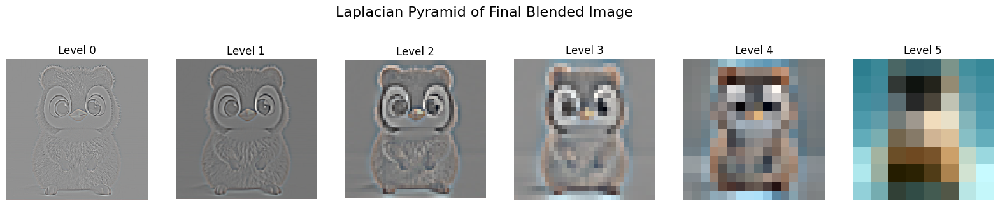

Generating Gauss pyramid for the blended result


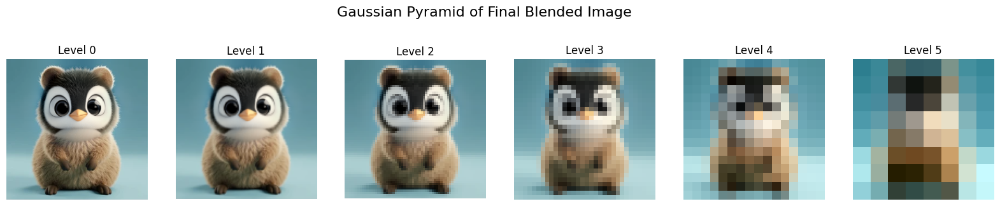

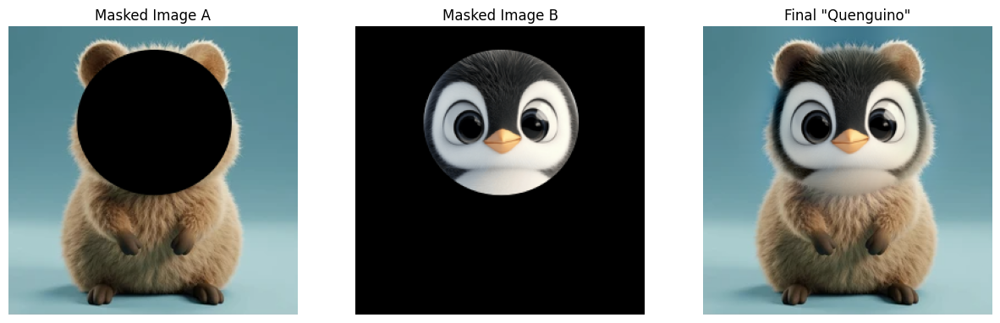

In [32]:
print(f"Resizing images to match Image A's shape: {image_a.shape}")
# Resize image_b to match image_a's shape
image_b = sktr.resize(image_b, image_a.shape)

#  ensure mask matches the 2D shape 
mask = sktr.resize(mask, (image_a.shape[0], image_a.shape[1]))

final_blend = blend_images(image_a, image_b, mask, levels=6)

print("Generating Laplacian pyramid for the blended result")
blended_lap_pyr = laplacian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Laplacian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_lap_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

print("Generating Gauss pyramid for the blended result")
blended_gaus_pyr = gaussian_pyramid(final_blend, levels=6)

# Display the pyramid
fig, axes = plt.subplots(1, len(blended_lap_pyr), figsize=(20, 4))
fig.suptitle('Gaussian Pyramid of Final Blended Image', fontsize=16)
for i, level in enumerate(blended_gaus_pyr):
    # normalize levels for display
    display_level = (level - level.min()) / (level.max() - level.min())
    axes[i].imshow(display_level)
    axes[i].set_title(f'Level {i}')
    axes[i].axis('off')

plt.show() 

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(mask[:,:,np.newaxis] * image_a)
axes[0].set_title('Masked Image A')
axes[0].axis('off')
axes[1].imshow((1-mask[:,:,np.newaxis]) * image_b)
axes[1].set_title('Masked Image B')
axes[1].axis('off')
axes[2].imshow(final_blend)
axes[2].set_title('Final "Quenguino"')
axes[2].axis('off')
plt.show()